<a href="https://colab.research.google.com/github/HwangHanJae/Dacon_tutorial/blob/main/soccer_player_value_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 라이브러리 로드

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from IPython.display import set_matplotlib_formats

plt.style.use("ggplot")
warnings.filterwarnings("ignore")
set_matplotlib_formats("svg")

# 데이터 불러오기

In [3]:
path = "/content/drive/MyDrive/Colab Notebooks/DataScience/Data/soccer_player/"

train = pd.read_csv(path + "train.csv")
test = pd.read_csv(path + "test.csv")

# 데이터 미리보기

In [4]:
train.shape, test.shape

((8932, 12), (3828, 11))

In [5]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


In [6]:
test.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves
0,1,Cristiano Ronaldo,33,europe,2022,ST,right,5.0,94,94,5.0
1,2,Neymar Jr,26,south america,2022,ST,right,5.0,92,93,5.0
2,4,K. De Bruyne,27,europe,2023,MF,right,4.0,91,92,4.0
3,5,E. Hazard,27,europe,2020,ST,right,4.0,91,91,4.0
4,6,L. Modrić,32,europe,2020,MF,right,4.0,91,91,4.0


In [7]:
train.tail()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
8927,16925,S. Adewusi,18,africa,2019,MF,right,1.0,48,63,3.0,60000.0
8928,16936,C. Ehlich,19,europe,2020,DF,right,1.0,47,59,2.0,40000.0
8929,16941,N. Fuentes,18,south america,2021,DF,right,1.0,47,64,2.0,50000.0
8930,16942,J. Milli,18,europe,2021,GK,right,1.0,47,65,1.0,50000.0
8931,16948,N. Christoffersson,19,europe,2020,ST,right,1.0,47,63,2.0,60000.0


In [8]:
test.tail()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves
3823,16924,R. Takae,20,asia,2021,MF,right,1.0,48,63,2.0
3824,16929,L. Wahlstedt,18,europe,2018,GK,right,1.0,48,65,1.0
3825,16932,Y. Góez,18,south america,2021,MF,right,1.0,48,65,2.0
3826,16937,A. Kaltner,18,europe,2020,ST,right,1.0,47,61,2.0
3827,16943,K. Fujikawa,19,asia,2021,MF,right,1.0,47,61,2.0


In [24]:
# e+ 포맷 변경하기
pd.options.display.float_format = "{:.1f}".format

In [25]:
train['value'].describe()

count        8932.0
mean      2778673.3
std       5840981.5
min         10000.0
25%        375000.0
50%        825000.0
75%       2600000.0
max     110500000.0
Name: value, dtype: float64

In [9]:
train['continent'].unique()

array(['south america', 'europe', 'africa', 'asia', 'oceania'],
      dtype=object)

In [10]:
train['contract_until'].unique()

array(['2021', '2020', '2019', '2023', '2022', '2024', 'Jun 30, 2019',
       '2026', 'Dec 31, 2018', '2018', '2025', 'Jun 30, 2020',
       'May 31, 2020', 'May 31, 2019', 'Jan 31, 2019', 'Jan 1, 2019',
       'Jan 12, 2019'], dtype=object)

In [11]:
test['contract_until'].unique()

array(['2022', '2023', '2020', '2021', 'Jun 30, 2019', '2019', '2025',
       '2024', '2018', 'May 31, 2020', 'Jun 30, 2020', 'May 31, 2019',
       'Dec 31, 2019', 'Dec 31, 2018', 'Jun 1, 2019', 'Jan 1, 2019',
       'Jan 31, 2019', '2026'], dtype=object)

In [12]:
train['age'].describe()

count    8932.000000
mean       25.209136
std         4.635515
min        16.000000
25%        21.000000
50%        25.000000
75%        28.000000
max        40.000000
Name: age, dtype: float64

In [13]:
train['position'].unique()

array(['ST', 'GK', 'DF', 'MF'], dtype=object)

In [14]:
train['prefer_foot'].unique()

array(['left', 'right'], dtype=object)

In [15]:
train['reputation'].unique()

array([5., 4., 3., 1., 2.])

In [16]:
train['reputation'].describe()

count    8932.000000
mean        1.130878
std         0.423792
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         5.000000
Name: reputation, dtype: float64

In [17]:
train['stat_overall'].describe()

count    8932.000000
mean       67.091133
std         6.854910
min        47.000000
25%        63.000000
50%        67.000000
75%        72.000000
max        94.000000
Name: stat_overall, dtype: float64

In [18]:
train['stat_potential'].describe()

count    8932.000000
mean       71.997201
std         5.988147
min        48.000000
25%        68.000000
50%        72.000000
75%        76.000000
max        94.000000
Name: stat_potential, dtype: float64

In [19]:
train['stat_skill_moves'].describe()

count    8932.000000
mean        2.401702
std         0.776048
min         1.000000
25%         2.000000
50%         2.000000
75%         3.000000
max         5.000000
Name: stat_skill_moves, dtype: float64

In [21]:
train.isnull().sum()

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
value               0
dtype: int64

In [22]:
test.isnull().sum()

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
dtype: int64

# EDA

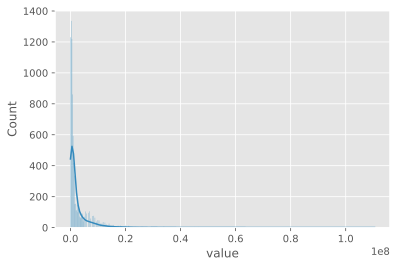

In [20]:
sns.histplot(data=train, x='value', kde=True)

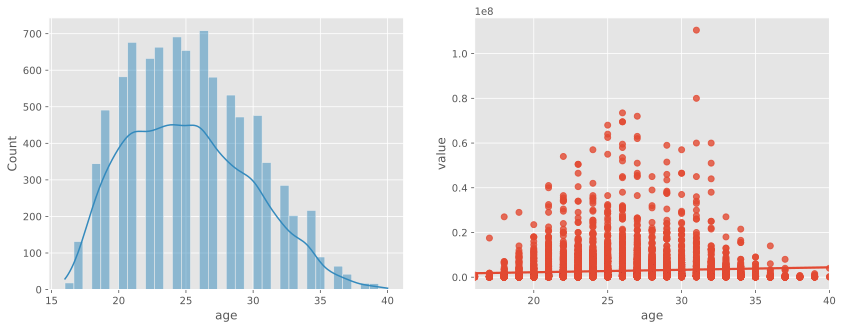

In [38]:
#age 분포와 value 값 비교
f, ax = plt.subplots(1,2,figsize=(14,5))
sns.histplot(data=train , x='age', kde=True, ax=ax[0])
sns.regplot(data=train, x='age',y='value', ax=ax[1])
plt.show()

In [39]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


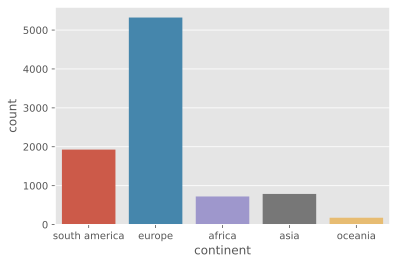

In [42]:
# continent와 value 비교

sns.countplot(data=train, x='continent')

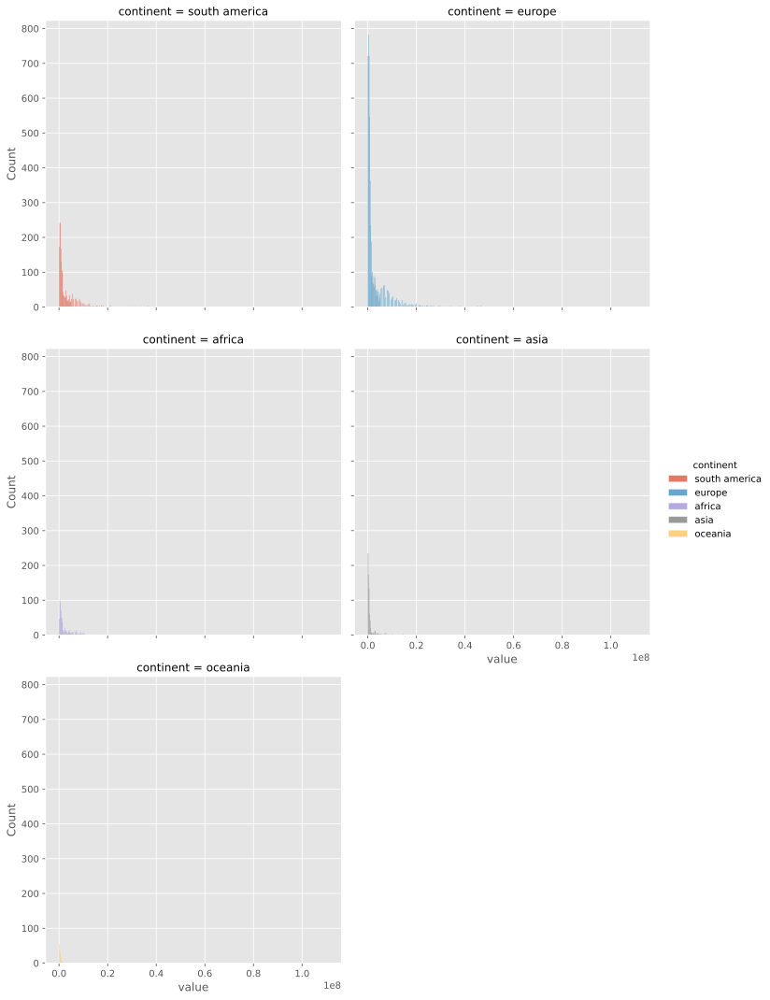

In [44]:
sns.displot(data=train, x='value', col='continent', col_wrap=2, hue='continent')

In [51]:
train.groupby(['continent'])['value'].median().sort_values(ascending=False)

continent
south america   1100000.0
africa          1000000.0
europe           825000.0
asia             425000.0
oceania          400000.0
Name: value, dtype: float64

In [52]:
train.groupby(['continent'])['value'].mean().sort_values(ascending=False)

continent
south america   3183204.5
africa          2972246.9
europe          2928124.8
asia            1035146.1
oceania          822542.9
Name: value, dtype: float64

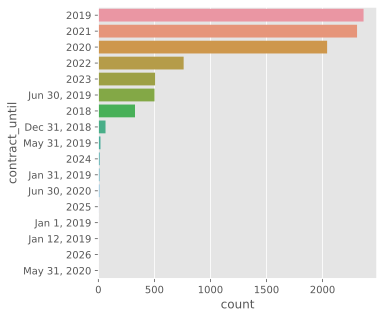

In [63]:
#contract_until vs value
plt.figure(figsize=(5,5))
sns.countplot(data=train, y='contract_until', order = train['contract_until'].value_counts().index)

In [113]:
#contract_until 특성을 약간의 전처리
# 년도 말고 월, 일이 적인 값을 년도로 통합

#print(train['contract_until'].unique())

for year in train['contract_until'].unique():
  if ',' in year:
    train.loc[train['contract_until'] == year, "year"] = year.split(',')[1]
  else : 
    train.loc[train['contract_until'] == year, 'year'] = year

  train['year'] = train['year'].astype(np.int64)

In [115]:
for year in test['contract_until'].unique():
  if ',' in year : 
    test.loc[test['contract_until'] == year, "year"] = year.split(',')[1]
  else:
    test.loc[test['contract_until'] == year, 'year'] = year

  test['year'] = test['year'].astype(np.int64)

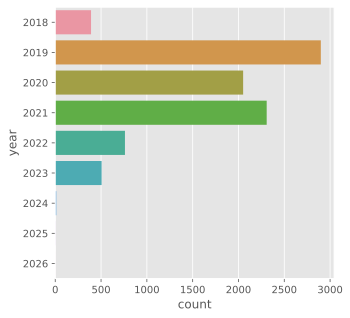

In [121]:
train['year'].unique().sort()

plt.figure(figsize=(5,5))
sns.countplot(data=train, y='year')

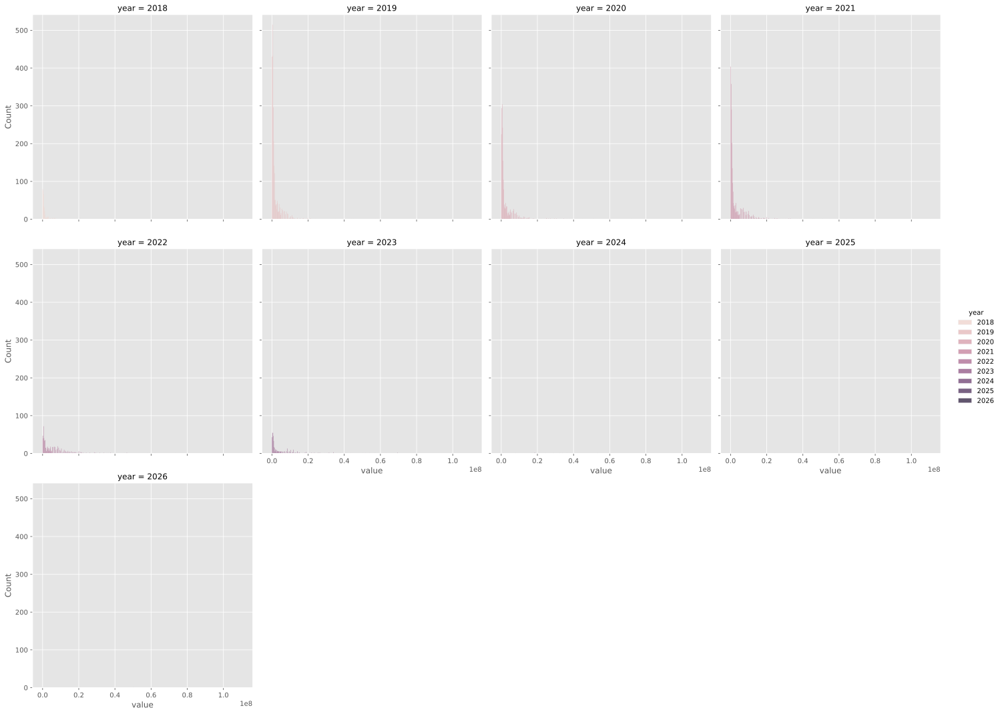

In [123]:
sns.displot(data=train, x='value', col='year', hue='year', col_wrap=4)

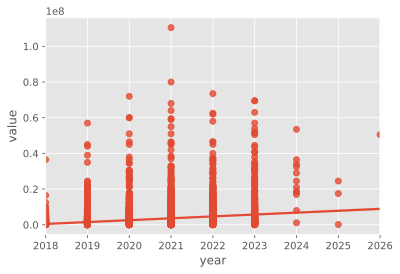

In [124]:
sns.regplot(data=train, x='year', y='value')

In [125]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,year
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0,2021
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0,2020
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0,2021
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0,2020
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0,2021


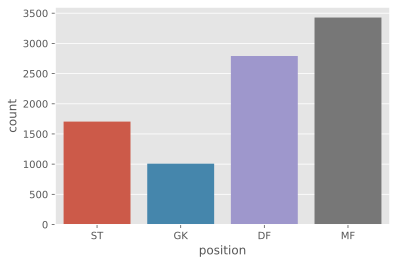

In [126]:
#position vs value
sns.countplot(data=train, x='position')

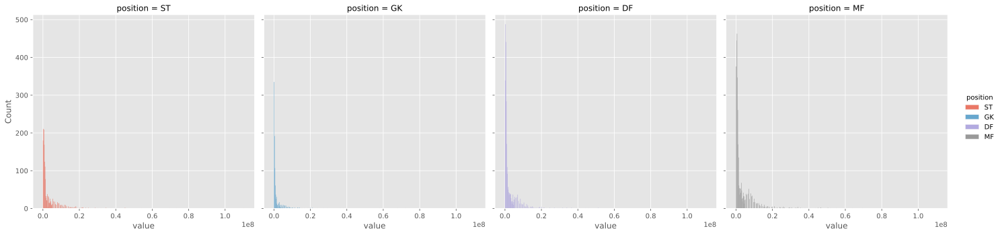

In [127]:
#position vs value

sns.displot(data=train, x='value', col='position', hue='position')

In [130]:
train.groupby(['position'])['value'].mean().sort_values(ascending=False)

position
ST   3330360.7
MF   3121762.0
DF   2304347.9
GK   1992073.4
Name: value, dtype: float64

In [132]:
train.groupby(['position'])['value'].median().sort_values(ascending=False)

position
ST   975000.0
MF   925000.0
DF   725000.0
GK   400000.0
Name: value, dtype: float64

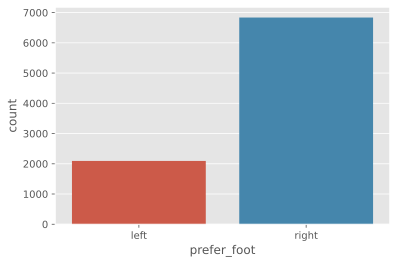

In [134]:
sns.countplot(data=train, x='prefer_foot')

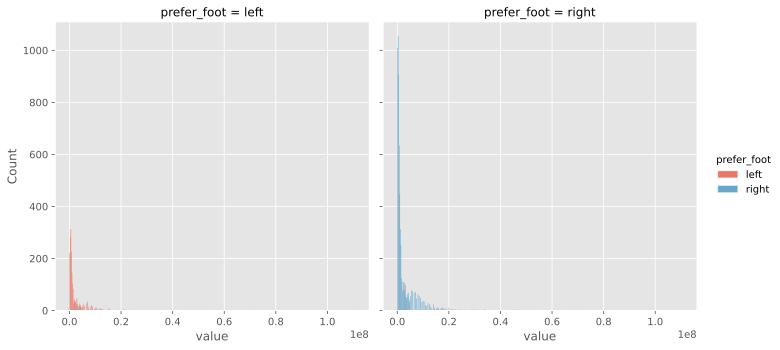

In [135]:
sns.displot(data=train, x='value', col='prefer_foot', hue='prefer_foot')

In [136]:
train.groupby(['prefer_foot'])['value'].mean()

prefer_foot
left    2865231.5
right   2752150.1
Name: value, dtype: float64

In [137]:
train.groupby(['prefer_foot'])['value'].median()

prefer_foot
left    875000.0
right   800000.0
Name: value, dtype: float64

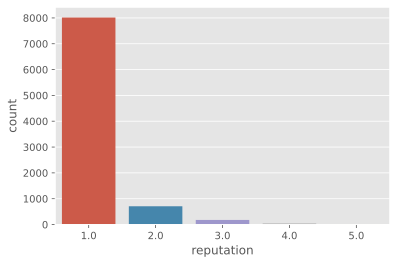

In [140]:
sns.countplot(data=train, x='reputation')

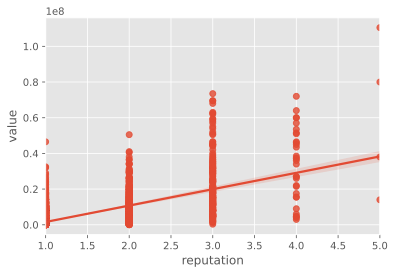

In [141]:
sns.regplot(data=train, x='reputation', y='value')

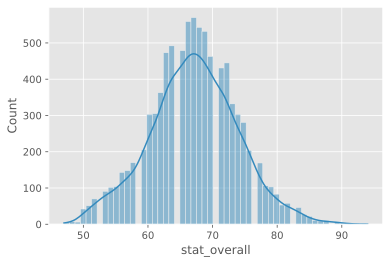

In [144]:
sns.histplot(data=train, x='stat_overall', kde=True)

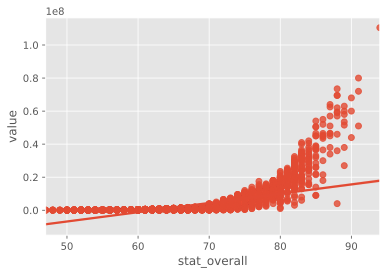

In [145]:
sns.regplot(data=train, x='stat_overall', y='value')

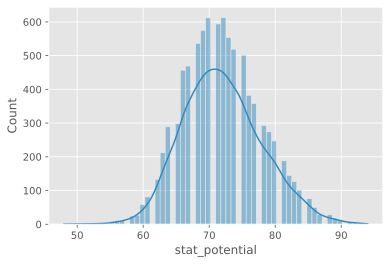

In [149]:
sns.histplot(data=train, x='stat_potential', kde=True)

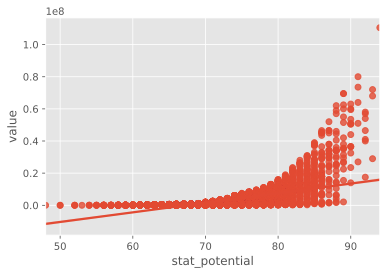

In [150]:
sns.regplot(data=train, x='stat_potential', y = 'value')

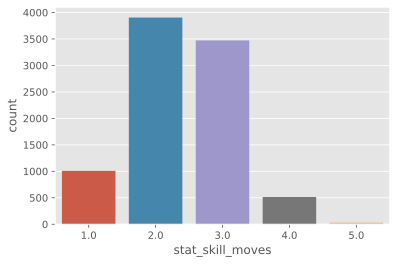

In [153]:
sns.countplot(data=train, x='stat_skill_moves')

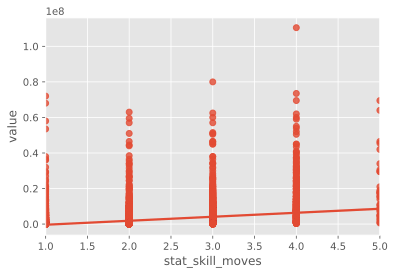

In [154]:
sns.regplot(data = train, x='stat_skill_moves', y='value')

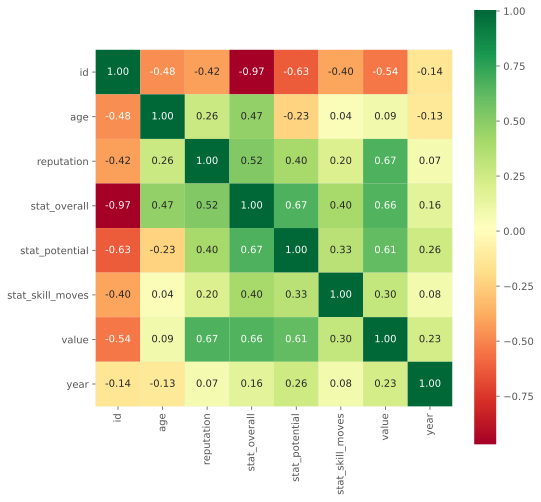

In [157]:
plt.figure(figsize=(8,8))
sns.heatmap(data=train.corr(), cmap='RdYlGn', annot=True, fmt='.2f', square=True)

# 데이터 전처리

In [163]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,year
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0,2021
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0,2020
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0,2021
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0,2020
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0,2021


In [ ]:
#데이터 다시 불러오기

path = "/content/drive/MyDrive/Colab Notebooks/DataScience/Data/soccer_player/"

train = pd.read_csv(path + "train.csv")
test = pd.read_csv(path + "test.csv")

In [171]:
#year 컬럼 생성
dfs = [train, test]

for df in dfs:
  for year in df['contract_until'].unique():
    if ',' in year:
      df.loc[df['contract_until'] == year, "year"] = year.split(',')[1]
    else : 
      df.loc[df['contract_until'] == year, 'year'] = year

    df['year'] = df['year'].astype(np.int64)

In [172]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,year
0,0,L. Messi,31,4,2021,ST,0,5.0,94,94,4.0,110500000.0,2021
1,3,De Gea,27,3,2020,GK,1,4.0,91,93,1.0,72000000.0,2020
2,7,L. Suárez,31,4,2021,ST,1,5.0,91,91,3.0,80000000.0,2021
3,8,Sergio Ramos,32,3,2020,DF,1,4.0,91,91,3.0,51000000.0,2020
4,9,J. Oblak,25,3,2021,GK,1,3.0,90,93,1.0,68000000.0,2021


In [173]:
test.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,year
0,1,Cristiano Ronaldo,33,3,2022,ST,1,5.0,94,94,5.0,2022
1,2,Neymar Jr,26,4,2022,ST,1,5.0,92,93,5.0,2022
2,4,K. De Bruyne,27,3,2023,MF,1,4.0,91,92,4.0,2023
3,5,E. Hazard,27,3,2020,ST,1,4.0,91,91,4.0,2020
4,6,L. Modrić,32,3,2020,MF,1,4.0,91,91,4.0,2020


In [175]:
train['year'].unique()

array([2021, 2020, 2019, 2023, 2022, 2024, 2026, 2018, 2025])

In [176]:
test['year'].unique()

array([2022, 2023, 2020, 2021, 2019, 2025, 2024, 2018, 2026])

In [177]:
#continent , position, prefer_foot 라벨인코딩 
#sklearn 패키지 사용
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

encoder_columns = ['continent', 'position', "prefer_foot"]
for column in encoder_columns:
  train[column] = label_encoder.fit_transform(train[column])
  test[column] = label_encoder.transform(test[column])

In [178]:
train.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,year
0,0,L. Messi,31,4,2021,3,0,5.0,94,94,4.0,110500000.0,2021
1,3,De Gea,27,3,2020,1,1,4.0,91,93,1.0,72000000.0,2020
2,7,L. Suárez,31,4,2021,3,1,5.0,91,91,3.0,80000000.0,2021
3,8,Sergio Ramos,32,3,2020,0,1,4.0,91,91,3.0,51000000.0,2020
4,9,J. Oblak,25,3,2021,1,1,3.0,90,93,1.0,68000000.0,2021


In [179]:
test.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,year
0,1,Cristiano Ronaldo,33,3,2022,3,1,5.0,94,94,5.0,2022
1,2,Neymar Jr,26,4,2022,3,1,5.0,92,93,5.0,2022
2,4,K. De Bruyne,27,3,2023,2,1,4.0,91,92,4.0,2023
3,5,E. Hazard,27,3,2020,3,1,4.0,91,91,4.0,2020
4,6,L. Modrić,32,3,2020,2,1,4.0,91,91,4.0,2020


In [180]:
train.isnull().sum()

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
value               0
year                0
dtype: int64

In [181]:
test.isnull().sum()

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
year                0
dtype: int64

# 모델

In [158]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, make_scorer

In [159]:
def rmse(y_true, y_pred):
  result = np.sqrt(mean_squared_error(y_true, y_pred))
  return result

In [183]:
column = ['age', 'year', 'continent', 'position','prefer_foot', 'reputation', 'stat_overall', 'stat_potential','stat_skill_moves']
target = ['value']

X = train[column]
y = train[target]

X_test = test[column]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state=42, shuffle = True)

print("Train set : ")
print(X_train.shape, y_train.shape)
print("Val set : ")
print(X_val.shape, y_val.shape)
print("Test shape : ")
print(X_test.shape)

Train set : 
(6252, 9) (6252, 1)
Val set : 
(2680, 9) (2680, 1)
Test shape : 
(3828, 9)


In [184]:
!pip install catboost

     |████████████████████████████████| 69.2 MB 4.8 kB/s 


In [188]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

models = [RandomForestRegressor(n_estimators=1000, random_state=42,),
          GradientBoostingRegressor(n_estimators=1000, random_state=42),
          XGBRegressor(n_estimators=1000, random_state=42),
          LGBMRegressor(n_estimators=1000, random_state=42),
          CatBoostRegressor(n_estimators=1000, random_seed=42)]

for model in models:
  model.fit(X_train, y_train)
  y_pred =  model.predict(X_val)
  print(model.__class__.__name__)
  print("score : {}".format(model.score(X_train, y_train)))
  print("rmse : {}".format(rmse(y_val, y_pred)))
  print()


RandomForestRegressor
score : 0.9975976668976649
rmse : 1095395.610983969

GradientBoostingRegressor
score : 0.9989421619931813
rmse : 800454.3130830951

[15:55:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor
score : 0.9988886420219287
rmse : 839109.0918688866

LGBMRegressor
score : 0.997821844109211
rmse : 1095206.7321085671

Learning rate set to 0.054087
0:	learn: 5427837.7722198	total: 48.7ms	remaining: 48.7s
1:	learn: 5195148.7145726	total: 50.2ms	remaining: 25s
2:	learn: 4983756.7621377	total: 51.6ms	remaining: 17.1s
3:	learn: 4754469.5815910	total: 52.9ms	remaining: 13.2s
4:	learn: 4562574.5703170	total: 54.4ms	remaining: 10.8s
5:	learn: 4368218.6766066	total: 55.9ms	remaining: 9.26s
6:	learn: 4188374.0938943	total: 57.2ms	remaining: 8.12s
7:	learn: 4012573.2463634	total: 58.7ms	remaining: 7.28s
8:	learn: 3860053.0170341	total: 60.2ms	remaining: 6.63s
9:	learn: 3708300.2015837	total: 61.5ms	remai

In [193]:
#XGB와 GB 모델 제출

xgb_model = XGBRegressor(n_estimators=1000, random_state=42)
gb_model =GradientBoostingRegressor(n_estimators=1000, random_state=42)

xgb_model.fit(X_train, y_train)
xgb_rmse = rmse(y_val, xgb_model.predict(X_val))
print("xgb_model : {}".format(xgb_rmse))
xgb_pred = xgb_model.predict(X_test)

gb_model.fit(X_train, y_train)
gb_rmse = rmse(y_val, gb_model.predict(X_val))
print("gb_model : {}".format(gb_rmse))
gb_pred = gb_model.predict(X_test)

[16:03:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
xgb_model : 839109.0918688866
gb_model : 800454.3130830951


In [201]:
submission = pd.read_csv(path + "submission.csv")
submission.head()

,id,value
0,1,0
1,2,0
2,4,0
3,5,0
4,6,0


In [202]:
#xgb 모델 제출
submission['value'] = xgb_pred
print(submission['value'].head())

sub_path = "/content/drive/MyDrive/Colab Notebooks/DataScience/My CSV/Dacon/soccer_player/"
sub_name = "xgb_basic_sub.csv"

submission.to_csv(sub_path +sub_name, index=False)

0   57900260.0
1   83856032.0
2   77379384.0
3   81076728.0
4   66156516.0
Name: value, dtype: float32


In [203]:
submission = pd.read_csv(path + "submission.csv")
submission.head()

,id,value
0,1,0
1,2,0
2,4,0
3,5,0
4,6,0


In [204]:
#gb 모델 제출
submission['value'] = gb_pred
print(submission['value'].head())

sub_path = "/content/drive/MyDrive/Colab Notebooks/DataScience/My CSV/Dacon/soccer_player/"
sub_name = "gb_basic_sub.csv"

submission.to_csv(sub_path +sub_name, index=False)

0   61320163.5
1   87079407.3
2   76899588.3
3   80884313.3
4   65419062.3
Name: value, dtype: float64


In [211]:
#교차검증

from sklearn.model_selection import KFold
k_fold = KFold(n_splits=5, shuffle=True, random_state=42)

model = GradientBoostingRegressor(n_estimators=1000, random_state=42)
rmse_preds = []
preds = []
for i, (train_idx, val_idx) in enumerate(k_fold.split(X),1):
  X_train = X.iloc[train_idx]
  y_train = y.iloc[train_idx]
  X_val = X.iloc[val_idx]
  y_val = y.iloc[val_idx]

  model.fit(X_train, y_train)
  kfold_predcit = model.predict(X_val)
  rmse_preds.append(rmse(y_val, kfold_predcit))


  print("{} : rmse : {}".format(i, rmse(y_val, kfold_predcit)))

  preds.append(model.predict(X_test))

print("mean : {}".format(np.mean(rmse_preds)))

1 : rmse : 950261.3382032467
2 : rmse : 372483.39584007795
3 : rmse : 566027.1309890219
4 : rmse : 564608.6141597877
5 : rmse : 600929.7578718646
mean : 610862.0474127997


In [223]:
#교차검증한 gb모델 제출
submission = pd.read_csv(path + "submission.csv")
print(submission.head())

submission['value'] = np.mean(preds, axis=0)
print(submission['value'].head())

sub_path = "/content/drive/MyDrive/Colab Notebooks/DataScience/My CSV/Dacon/soccer_player/"
sub_name = "gb_cross_val_sub.csv"

submission.to_csv(sub_path +sub_name, index=False)

   id  value
0   1      0
1   2      0
2   4      0
3   5      0
4   6      0
0   84099048.3
1   89725029.3
2   76995431.8
3   79670885.7
4   67488899.0
Name: value, dtype: float64


In [224]:

#xgb 교차검증

from sklearn.model_selection import KFold
k_fold = KFold(n_splits=5, shuffle=True, random_state=42)

model = XGBRegressor(n_estimators=1000, random_state=42)
rmse_preds = []
preds = []
for i, (train_idx, val_idx) in enumerate(k_fold.split(X),1):
  X_train = X.iloc[train_idx]
  y_train = y.iloc[train_idx]
  X_val = X.iloc[val_idx]
  y_val = y.iloc[val_idx]

  model.fit(X_train, y_train)
  kfold_predcit = model.predict(X_val)
  rmse_preds.append(rmse(y_val, kfold_predcit))


  print("fold_{} : rmse : {}".format(i, rmse(y_val, kfold_predcit)))

  preds.append(model.predict(X_test))

print("mean : {}".format(np.mean(rmse_preds)))

[16:23:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fold_1 : rmse : 957452.4192536417
[16:23:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fold_2 : rmse : 342188.02970125666
[16:23:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fold_3 : rmse : 573706.8045693119
[16:23:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fold_4 : rmse : 486364.6062211634
[16:23:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fold_5 : rmse : 781921.6861823803
mean : 628326.7091855508


In [225]:
#교차검증한 gb모델 제출
submission = pd.read_csv(path + "submission.csv")
print(submission.head())

submission['value'] = np.mean(preds, axis=0)
print(submission['value'].head())

sub_path = "/content/drive/MyDrive/Colab Notebooks/DataScience/My CSV/Dacon/soccer_player/"
sub_name = "xgb_cross_val_sub.csv"

submission.to_csv(sub_path +sub_name, index=False)

   id  value
0   1      0
1   2      0
2   4      0
3   5      0
4   6      0
0   77334768.0
1   91102272.0
2   80923480.0
3   80960528.0
4   68531296.0
Name: value, dtype: float32


In [228]:
GradientBoostingRegressor?

In [ ]:
#gb모델 튜닝
from sklearn.model_selection import GridSearchCV

clf = GradientBoostingRegressor(random_state=42)
params = {
    "loss" : ['ls','lad','huber','quantile'],
    'n_estimators' : [1000,2000,3000],
    "learning_rate" : [0.1, 0.01, 0.05],
    "max_depth" : [3,4,5]
}
grid = GridSearchCV(estimator=clf,
                    param_grid = params,
                    scoring=make_scorer(rmse, greater_is_better=False),
                    n_jobs=-1,
                    cv=5)

grid.fit(X,y)
print("튜닝 학습 완료")